In [1]:
import numpy as np
from matplotlib import pyplot as plt
from scipy import stats
%matplotlib inline
from IPython.display import Image

# Bayes Statistik: MCMC

- Monte Carlo Simulation & Markov-Ketten
    - Funktionsweise Metropolis-Algorithmus
    - Ergebnis
    - "Beweis" der Stabilität
- Varianten
    - Metropolis-Variante mit kontinuierlicher Sprungweite(跳级)
    - Metropolis-Variante im mehrdimensionalen Parameterraum
    - Gibbs-Sampling    
    - Hamiltonian Monte Carlo
    - No U-Turn Sampler
- Methode
    - Probleme
    - Implementierungen

## Wiederholung

#### Bayes Statistik

- Parameter $\theta$ als Zufallsvariable
    - mit Wahrscheinlichkeitsverteilung $p(\theta)$
    - "Wissen"

#### Satz von Bayes
- erlaubt Auffrischen des Wissens (Prior) unter der Erkenntnis neuer Versuchsergebnisse
    - $\Rightarrow\;$ Posterior
$$p(\theta\,|\,\mathrm{D}) = \frac{p(\mathrm{D}\,|\,\theta)\,p(\theta)}{p(\mathrm{D})}$$

#### Posterior
- Mathematisch geschlossen lösbar mit *conjugate Priors* zur *Likelihood*
- Numerisch lösbar per Gitter-Näherung
- Monte Carlo Methoden
    - Metropolis-Algorithmus
    - ...

### Ziel
- Nach Datenerhebung Wissen über den Parameter zu erlangen
- Dazu Posterior-Verteilung bestimmen
- Daraus Erwartungswert und *Credible Interval* auswerten

### Problem
Schlußfolgern (Satz von Bayes) erlaubt Berechnen des Posteriors, aber
- Mathematisch geschlossene Lösung oft nicht dem Problem angemessen
- Numerische Lösung (Gitter-Näherung) benötigt das Integral *evidence*
    - über alle Parameterkombinationen
    - mit hinreichend vielen Stützstellen
    - für komplexe Modelle nicht in endlicher Zeit und genau berechenbar (z.B. $100^{100}$)
        
### Lösung
- Markov Chain Monte Carlo Methode *MCMC*
    - Stichproben aus Posterior-Verteilung in einer Markov-Kette
    - Daraus Erwartungswert und Credible Interval schätzen

### Vorgehensweise
- (zufällige aber zielgerichtete, repräsentative) Stichprobe
    - "Monte Carlo"
    - gemäß der Posterior-Verteilung(!)

### Voraussetzungen MCMC
- Berechenbarkeit des Priors $p(\theta)$
    - für jeden Parameter-Vektor $\boldsymbol\theta \in \mathbb{R}^N$
- Berechenbarkeit der Likelihood $p(D|\boldsymbol\theta)$
    - für jedes Datum $D$ und jeden Parameter-Vektor $\boldsymbol\theta$


# Erinnerung: Vereinfachter Metropolis-Algorithmus "Insel hüpfen"

#### 1. Richtungsentscheidung
$$\theta_{\mathrm{Kandidat}} = \begin{cases} \theta_{\mathrm{aktuell}-1}\\ \theta_{\mathrm{aktuell}+1}\end{cases}$$
#### 2. Sprung-Wahrscheinlichkeit
a) Wenn $p(\theta_\text{Kandidat}) > p(\theta_\text{aktuell})$ dann gehe zu Kandidat
$$q_{\mathrm{Sprung}}=1$$
b) Wenn $p(\theta_\text{aktuell}) \geq p(\theta_\text{Kandidat})$ dann gehe proportional zum Wahrscheinlichkeits(dichte)-Verhältnis zum Kandidaten
$$q_{\mathrm{Sprung}}=\frac{p(\theta_\text{Kandidat})}{p(\theta_\text{aktuell})}$$
c) sonst bleibe
$$q_{\mathrm{Sprung}}=1-\frac{p(\theta_\text{Kandidat})}{p(\theta_\text{aktuell})}$$

#### 3. Posterior Verteilung
- Stichprobe für $\theta$ aus Posterior
- funktioniert, sobald Posterior für $\theta$ berechenbar

### Ergebnis
- Metropolis Algorithmus funktioniert
- Kette von Sprung-Zielen "Markov Chain":
    - Wahrscheinlichkeit der Aufenthalte $\equiv$ Wahrscheinlichkeit des Posteriors
    - $\Rightarrow$ Posterior Stichprobe
- Daraus Schätzer: *Mean Posterior* und *Highest Density Interval* (HDI), *Credible Interval* (CI)

### Vorteil
- Posterior-Verhältnis ist ausreichend $\,\Rightarrow\,$ *evidence* (Normierung) kann übergangen werden

### Beachten
- Anforderung an Form der Wahrscheinlichkeits-Verteilung

In [2]:
N = 20                                    # different possible values of... 
thetas = np.linspace(0., 1., N+1)         #   ... parameter theta
a, b = (3+1, 7+1) # prior knowledge as if 3 out of 10 in Beta distribution
n, z = (10, 6)                            # data is               6 out of 10
np.random.seed(987654)                    # random, but initialized same

'''Likelihood of Bernoulli-vector with z out of N hits under parameter theta'''
def BernoulliLikelihood(theta, n, z):
    return theta**z * (1-theta)**(n-z)

In [3]:
'''since we know the complete distribution, we can speed up'''
# calculate all possible values at once
Likelihood   = BernoulliLikelihood(thetas, n, z)
Prior        = stats.beta(a, b).pdf(thetas) # and all possible priors as well
PosteriorRel = Likelihood * Prior           # posterior, *not* normalized   
np.random.seed(987654)                      # random, but initialized same

index = 2                  # start position (in principle random)
twalk = [thetas[index]]    # first value of random walk list

'''now the ready arrays can be evaluated (even this step could be pre calculated...)'''
def hoptest(ic, ip):
    return min(1., PosteriorRel[ip] / PosteriorRel[ic])

# walk through posterior
for j in range(5000):              # or 50.000 or ...
    tcurr = thetas[index]          # current theta
    if stats.bernoulli(.5).rvs():  # direction 50:50; 1=step forward
        if index>=N:  # end of indices
            step = 0  # do not jump; don't change t-index
        else:
            step = stats.bernoulli(hoptest(index, index+1)).rvs()   # +1 or 0
    else:             # direction 0=step backward
        if index<=0:  # first of indices
            step = 0  # do not jump; don't change t-index
        else:
            step = -stats.bernoulli(hoptest(index, index-1)).rvs()  # -1 or 0
    index += step     # update index according to move direction
    twalk += [thetas[index]]

print('the walk went {} steps'.format(len(twalk)))

the walk went 5001 steps


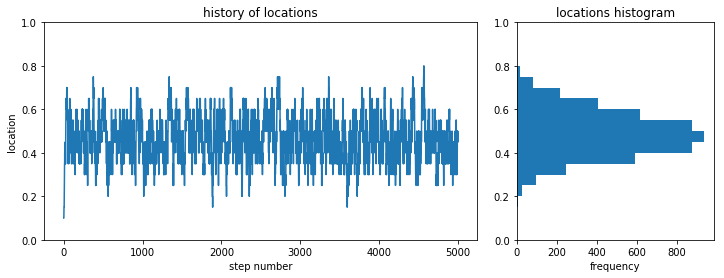

In [6]:
'''show complete Metropolis walk (5000 steps) together 
with distribution of (discrete) locations'''
fig = plt.figure(figsize=(12, 4))
# upper marginal 3x1, until 3rd column
fwalk = plt.subplot2grid((1, 3), (0, 0), colspan=2)
fwalk.set_ylim((0, 1))
fwalk.plot(twalk)
fwalk.set_title('history of locations')
fwalk.set_xlabel('step number')
fwalk.set_ylabel('location')
# right marginal 1x3, start 2nd row, last col
fhist = plt.subplot2grid((1, 3), (0, 2))
fhist.hist(twalk, bins=np.linspace(0., 1., N+1), orientation='horizontal')
fhist.set_ylim((0, 1))
fhist.set_xlabel('frequency')
fhist.set_title('locations histogram');

In [8]:
'''helper functions for intervals'''
from AngStII_Bayes import HDIofICDF, HDIofGrid

# show 95% credible interval for theoreticel beta distribution
print('Posterior HDI 95% {}'.format(
    HDIofICDF(stats.beta, credmass=0.95, a=6, b=14)))

Posterior HDI 95% [ 0.11423475  0.49671525]


In [8]:
# check HDI of mcmc-posterior
bins=np.linspace(-0.5/N, 1.+.5/N, N+2)
HDIofGrid(np.histogram(twalk, bins=bins)[0])

{'height': 217,
 'indices': array([ 6,  7,  8,  9, 10, 11, 12, 13]),
 'mass': 0.95360927814437113}

estimated   95% HDI  0.275 - 0.625
theoretical 95% Icdf 0.254 - 0.657


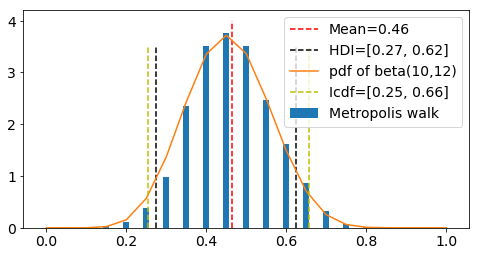

In [9]:
'''result of Metropolis walk: posterior distribution => Mean and HDI'''
fig = plt.figure(figsize=(8, 4))

# estimate mean and HDI from Metropolis walk
# Estimate of posterior's expectation value
mean = np.asarray(twalk).mean()
plt.plot(2*[mean], [0, 4.0], 'r--', label='Mean={:.2f}'.format(mean))
histo = plt.hist(twalk, bins=bins, normed=True,
                 label='Metropolis walk', rwidth=.3)
hdiinfo = HDIofGrid(histo[0])
# full range within 95%: lower&upper
hdil, hdiu = histo[1][hdiinfo['indices'][[0, -1]]]
plt.plot(2*[hdil], [0, 3.500], 'k--',
         label='HDI=[{:.2f}, {:.2f}]'.format(hdil, hdiu))
# start ^- & end <- of upper bin included in 95%
plt.plot(2*[hdiu], [0, 3.500], 'k--')

# theoretical posterior is known as Beta("Data"+"Prior")
# freeze theoretical posterior distribution for easy re-using
dposterior = stats.beta(a+z, b+n-z)
plt.plot(thetas, dposterior.pdf(thetas),
         label='pdf of beta({},{})'.format(a+z, b+(n-z)))
# now frozen distribution possible
bl, bu = HDIofICDF(dposterior, credmass=0.95)
plt.plot(2*[bl], [0, 3.5], 'y--',
         label='Icdf=[{:.2f}, {:.2f}]'.format(bl, bu))
plt.plot(2*[bu], [0, 3.5], 'y--')

plt.legend(loc='upper right');
print('estimated   95% HDI  {:.3f} - {:.3f}'.format(hdil, hdiu))
print('theoretical 95% Icdf {:.3f} - {:.3f}'.format(bl, bu))

# Beweis der Stabilität des Metropolis-Algorithnus'
... über Wechsel-Matrix möglich:
Mehrfachanwendung stabilisiert sich bei stationärem Wert = Posterior-Verteilung.

$$\mathbf{T} \tilde{\mathbf{p}}(\theta) = \tilde{\mathbf{p}}(\theta)$$


$$T=\begin{pmatrix}
\ddots & 0 & 0 & 0 & \dots \\
\dots & p(\theta_{i-2}\rightarrow\theta_{i-1}) & 0 & 0 & 0 \\
\dots & p(\theta_{i-1}\rightarrow\theta_{i-1}) & p(\theta_{i-1}\rightarrow\theta_{i}) & 0 & 0 \\
0 & p(\theta_{i}\rightarrow\theta_{i-1}) & p(\theta_{i}\rightarrow\theta_{i}) & p(\theta_{i}\rightarrow\theta_{i+1}) & 0 \\
0 & 0 & p(\theta_{i+1}\rightarrow\theta_{i}) & p(\theta_{i+1}\rightarrow\theta_{i+1}) & \dots \\
0 & 0 & 0 & p(\theta_{i+2}\rightarrow\theta_{i+1}) & \dots \\
\dots & 0 & 0 & 0 & \ddots \\
\end{pmatrix}$$

mit (beispielsweise)
$$ p(\theta_{i-2}\rightarrow\theta_{i-1}) = \frac{1}{2}\;\mathrm{min}\bigl(1, \frac{p(\theta_{i-1})}{p(\theta_{i-2})}\bigr) $$


1/2 各50%的可能性

#### Matrix-Multiplikation
Angenommen, stabiler Zustand ist erreicht: $\tilde{\mathbf{p}}(\theta)$.

Für eine Komponente $i$ gilt

$$\begin{aligned} \sum_r p(\theta_r) T_{ri} 
&= \;p(\theta_{i-1})\cdot\frac{1}{2} \mathrm{min}(1, \frac{p(\theta_i)}{p(\theta_{i-1})}) \\
&\quad +\; p(\theta_{i})\cdot\frac{1}{2}\Bigl(\bigl(1-\mathrm{min}(1, \frac{p(\theta_{i-1})}{p(\theta_{i})}) \bigr)+\bigl(1-\mathrm{min}(1, \frac{p(\theta_i)}{p(\theta_{i+1})})\bigr)\Bigr) \\
&\quad +\; p(\theta_{i+1})\cdot\frac{1}{2} \mathrm{min}(1, \frac{p(\theta_i)}{p(\theta_{i+1})})
\end{aligned}$$

Für den Fall $\theta_i>\theta_{i-1}$ und $\theta_i>\theta_{i+1}$ ergibt sich

$$\begin{aligned} p(\theta_{ineu}) = \sum_r p(\theta_r) T_{ri} 
&=\;p(\theta_{i-1})\cdot\frac{1}{2} \\
& \quad+ p(\theta_{i})\cdot\frac{1}{2}\Bigl(\bigl(1-\frac{p(\theta_{i-1})}{p(\theta_{i})}\bigr)+\bigl(1-\frac{p(\theta_i)}{p(\theta_{i+1})}\bigr)\Bigr) \\
& \quad+ p(\theta_{i+1})\cdot\frac{1}{2} \\
&= \;p(\theta_i)
\end{aligned}$$

... und dasselbe für jede andere der möglichen Fallunterscheidungen **[ÜA]**

## Ergebnis vereinfachter Metropolis-Algorithmus
- Es gibt einen stabilen Zustand
- Dieser stabile Zustand repräsentiert die Verteilung

#### ?
- Wird dieser stabile Zustand erreicht?
- Ist das der einzige stabile Zustand?
- Wann ist er erreicht?

# Fragen?

# Erweiterung A): Kontinuierlicher Metropolis-Algorithmus
*Metropolis-Algorithmus* (nach Metropolis, Rosenbluth, Rosenbluth, Teller & Teller 1953)

|Metropolis   | vereinfachter         $\qquad$ | kontinuierlicher       $\qquad$  |
|:------------|:-------------------------------|:-------------------------------- |
|Dimension    | $\mathbb{R}$                   | $\mathbb{R}$                     |
|Ziele        | $\theta_i; \; i\in \mathbb{N}$ | $\theta \in \mathbb{R}$          |
|Schrittweite | $\Delta i \in [-1, 0, +1]$     | $d\sim \mathcal{N}(0, \sigma^2)\in\mathbb{R}$ |


### Voraussetzung
- Verteilung $p(\boldsymbol\theta)$
    - berechenbar $\forall\theta_i$
    - keine Bereiche mit $p(\theta)\equiv0$

## Durchführung
#### 1. Sprungweite und -richtung
$$\Delta\theta \sim \mathcal{N}(\mu=0, \sigma^2)$$
$$\theta_{\text{new}} = \theta_{\text{cur}} + \Delta\theta$$

#### 2. Wahrscheinlichkeit dafür
$$\begin{aligned}
p_{\text{move}} &= \min \left( 1, \frac{P(\theta_{\text{new}})}{P(\theta_{\text{cur}})} \right) \\
\quad &= \min \left(1, \frac{p(D|\theta_{\text{new}})p(\theta_{\text{new}})}{p(D|\theta_{\text{cur}})p(\theta_{\text{cur}})} \right)
\end{aligned}$$
und $p_{\text{move}}=0$ wenn außerhalb des erlaubten Parameter-Bereichs.

#### 3. Verteilungen
beispielsweise
$$p(D\,|\,\theta_{\text{x}}) = \text{Bernoulli}(z,N\,|\,\theta_{\text{x}})$$
$$p(\theta_{\text{x}}) = \text{beta}(\theta_{\text{x}}\,|\,a,b)$$

#### 4. Abbruch-Kriterium
Wenn genügend unabhängige Samples vorliegen ...

## Verschiedene Sprungweitenverteilungen 
- $\sigma\in [0.02; 0.2; 2.0]$ 
- unwissender Prior $\text{beta}(\theta|1,1)$
- Daten $N=20$, $z=14$

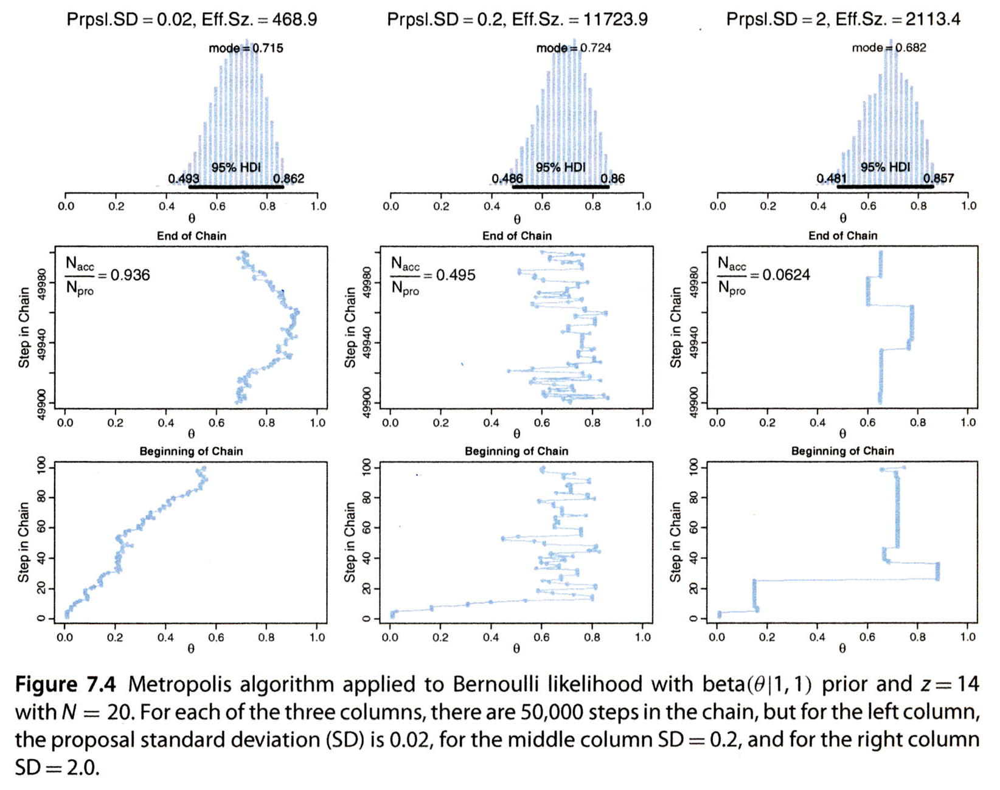

## Ergebnis kontinuierlicher Metropolis Algorithmus

- Metropolis Algorithmus funktioniert (meistens)
- Schrittweite ist manchmal kritisch
    - zB. Verteilung mit einem schmalen und einem breiten Peak
- Näherung an Posterior gut
    - immer noch nicht perfekt; mit 50.000 Grid-Berechnungen wäre hier die Genauigkeit viel besser gewesen
- im N-dimensionalen sieht das ganz anders aus...

# Erweiterung B): Metropolis-Algorithmus mehrdimensional

#### Fragestellung

- Medizin: zwei Gruppen Patienten, eine bekommt Plazebo, eine ein neues Medikament. 
    - Wirkt das Medikament?
- Verhaltensfotrschung: zwei Gruppen Versuchspersonen, eine spielt Ballerspiele, eine spielt Tetris.
    - Auswirkung auf Konzentrationstest gelöst/nicht gelöst?
- Münzwurf: zwei verschiedene Münzen mit $\theta_1$ und $\theta_2$. 

#### Voraussetzungen $\star$

- Unabhängigkeit der Daten (wie bisher)
- Unabhängigkeit der Parameter $\theta_1$ und $\theta_2$

|Metropolis   | vereinfachter        $\qquad$  | verallgemeinerter   $\qquad\quad$    | 
|:------------|:-------------------------------|:------------------------------------ |
|Dimension    | $\mathbb{R}^1$                 | $\mathbb{R}^N$                       |
|Ziele        | $\theta_i; \; i\in \mathbb{N}$ | $\boldsymbol\theta \in \mathbb{R}^N$ |
|Schrittweite | $\Delta i \in [-1, 0, +1]$     | $\mathbf{d}\sim mv\mathcal{N}(\mathbf{0}, \boldsymbol\sigma^2)\in\mathbb{R}^N$ |

## Gemeinsame Verteilung

Aus Unabhängigkeit folgt
$$p(\theta_1, \theta_2) = p(\theta_1)p(\theta_2)$$

Normierung
$$\int_{\theta_1}\int_{\theta_2} p(\theta_1, \theta_2)\;\mathrm{d}\theta_2\mathrm{d}\theta_1 = 1$$


## Daten
- Tupel gemeinsamer Merkmale (2 Münzen, 2 Gruppen, ...)
    - je Versuchsdurchführung
    - zB. 32/48 und 24/52 
- (Nicht unbedingt paarweise erhoben
    - zwei Münzen gleichzeitig geworfen
    - Erinnerung: t-Test unabhängig oder gepaart)

#### Unabhängigkeit bedeutet
$p(y_1\,|\,\theta_1, \theta_2) = p(y_1\,|\,\theta_1)$ und $\;p(y_2\,|\,\theta_1, \theta_2) = p(y_2\,|\,\theta_2)$

#### Mehrfache Durchführung
$z_1 = \sum_{i=1}^{N_1} y_{1i}\;$ und  $\;z_2 = \sum_{i=1}^{N_2} y_{2i}$

#### Datensatz 
$D=\{z_1, N_1, z_2, N_2\}$

#### Likelihood 
$$\begin{aligned}
p(D\,|\,\theta_1, \theta_2) &= \prod_{y_{1i}\in D_1} p(y_{1i}\,|\,\theta_1, \theta_2)
                               \prod_{y_{2j}\in D_2} p(y_{2j}\,|\,\theta_1, \theta_2) \\
                            &= \theta_1^{z_1}(1-\theta_1)^{N_1-z_1}\theta_2^{z_2}(1-\theta_2)^{N_2-z_2}
\end{aligned}$$

## Bayes Schlußfolgerung

Posterior
$$\begin{aligned}
p(\theta_1, \theta_2\,|\,D) &= p(D\,|\,\theta_1, \theta_2) p(\theta_1, \theta_2) \Big/ p(D) \\
                            &= p(D\,|\,\theta_1, \theta_2) p(\theta_1, \theta_2) \;\Big/ \int_{\theta_1'}\int_{\theta_2'} p(D\,|\,\theta_1', \theta_2') p(\theta_1',\theta_2') \;\mathrm{d}\theta_1'\mathrm{d}\theta_2'
\end{aligned}$$

## Exakte Lösung unter *conjugate Prior* Beta-Verteilung

Posterior
$$\begin{aligned}
p(\theta_1, \theta_2\,|\,D) &= p(D\,|\,\theta_1, \theta_2) p(\theta_1, \theta_2) \Big/ p(D) \\
                            &= \frac{ \theta_1^{z_1}(1-\theta_1)^{N_1-z_1}\theta_2^{z_2}(1-\theta_2)^{N_2-z_2}
                                      \theta_1^{a_1-1}(1-\theta_1)^{b_1-1}\theta_2^{a_2-1}(1-\theta_2)^{b_2-1} }
                                    { p(D)\; B(a_1,b_1)B(a_2,b_2) }
\end{aligned}$$
mit, wegen Normierung
$$p(D)\; B(a_1,b_1)B(a_2,b_2) = B(z_1+a_1, N_1-z_1+b_1)B(z_2+a_2, N_2-z_2+b_2)$$

also für den Posterior wieder einer Beta-Verteilung

### Ergebnis

Analog zum eindimensionalen Fall.


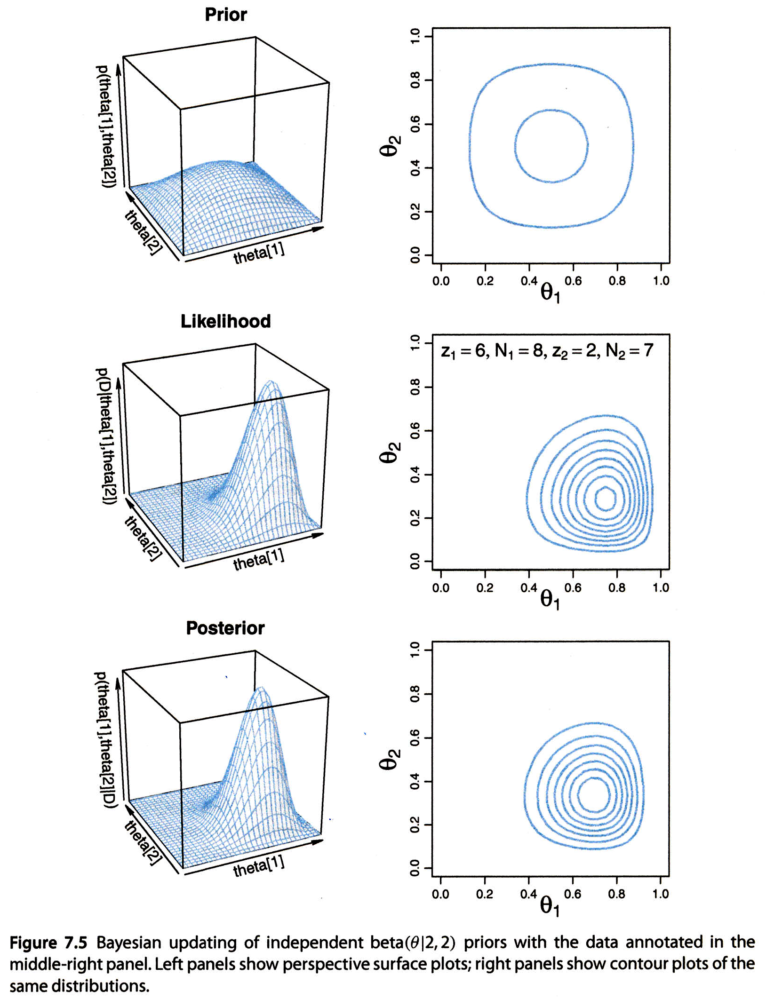

In [2]:
'''Bayes reasoning in 2D. Aus: Kruschke (2015) "Doing Bayesian Data Analysis, 2nd"'''

# Metropolis Algorithmus 2D

- analog zum eindimensionalen Fall:
- bivariate Normalverteilung zur Sprungvorhersage
    - kann Kovarianz haben, wenn Daten korrelieren

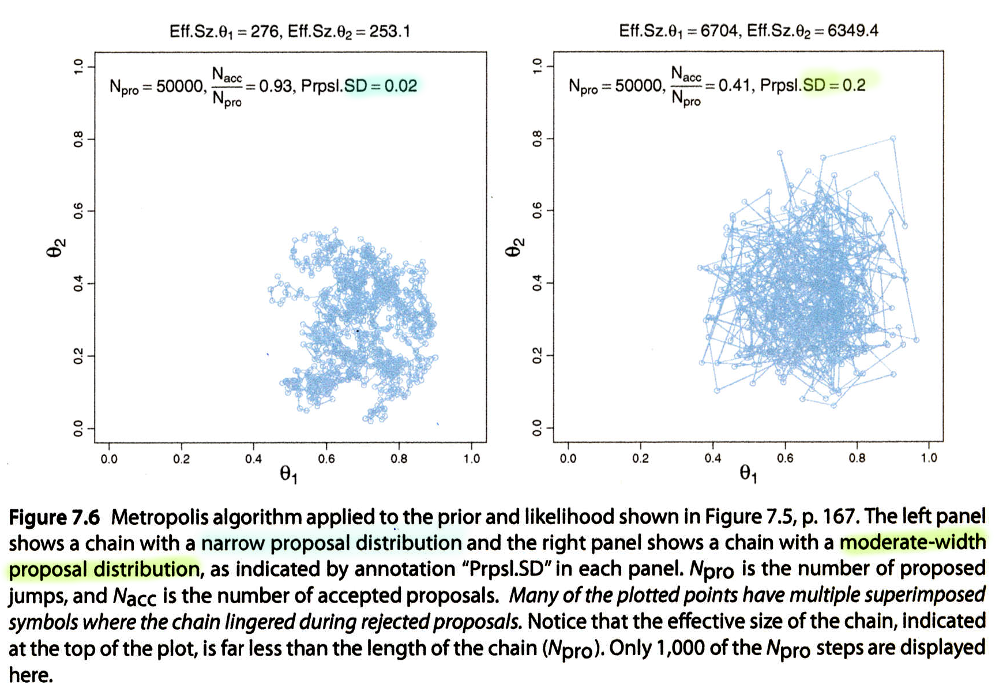

In [6]:
'''2D Metropolis; different step size distribution. Aus: Kruschke (2015) "Doing Bayesian Data Analysis, 2nd"'''

## Problem
Enge Verteilungen werden schlecht erreicht

# Gibbs Sampling

- Autoren: Geman & Geman 1984
- Benannt nach dem Physiker J. W. Gibbs: Statistische Mechanik und Thermodynamik
- Spezialfall des Metropolis-Hastings-Algorithmus

#### Gemeinsamkeiten
- Random Walk
- Markov Chain

#### Unterschied
- Jeder Schritt nur entlang eines Parameters, andere fest; meist zyklisch
    - Bedingte Wahrscheinlichkeitsverteilung $p(\theta_i|\{\theta_{j\neq i}\},D)$
    - Form bekannt $\,\Rightarrow\,$ direkte Zufallsauswahl
    - Anspringen (es entfällt kein Schritt)

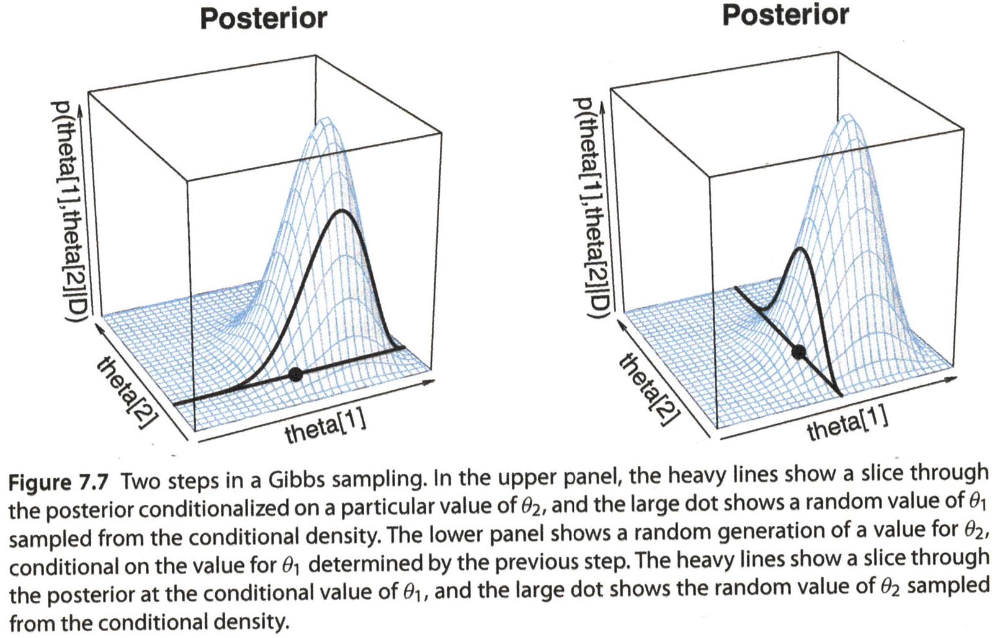

In [12]:
'''Gibbs sampling: two conditionals one after another. Aus: Kruschke (2015) "Doing Bayesian Data Analysis, 2nd"'''

#### Vorteil
- Anwendbar, wenn gesamte Verbundwahrscheinlichkeit nicht bestimmt werden kann $p(\{\theta_i\}|D)$, 
    - lediglich die bedingten Wahrscheinlichkeiten $p(\theta_i|\{\theta_{j\neq i}\},D)$
    - diese dafür bekannt
- effektiver, da (fast) alle Schritte zählen
- gleiches Ergebnis im Limes

#### Einschränkung
- nicht anwendbar, wenn bedingte Wahrscheinlichkeit nicht bestimmbar
- oder keine Zufallszahlen daraus gezogen werden können

#### Literatur:
- Gelfand & Smith 1990
- McGrayne 2011
- Bolstad 2009 -> Mathematik zum Metropolis-Hastings Algorithmus

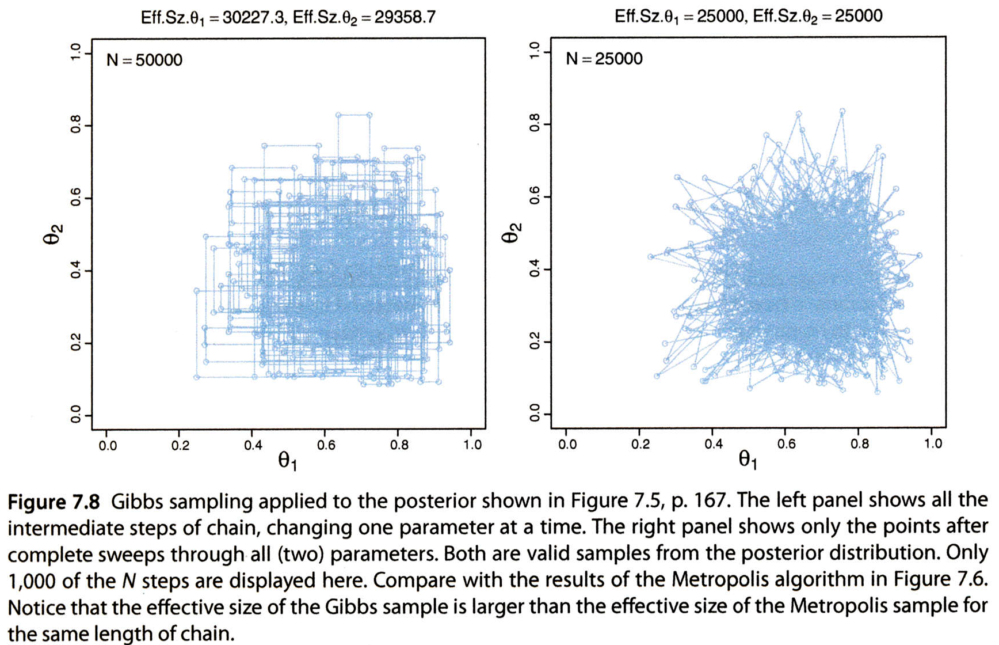

In [33]:
'''Gibbs sampling 2D: resulting Markov chain. Aus: Kruschke (2015) "Doing Bayesian Data Analysis, 2nd"'''

## Implementierungen
### BUGS
- **B**ayesian-inference **U**sing **G**ibbs **S**ampling
- Erste weit verbreitete Implementierung: 
    - *Winbugs* 1997
- Heute `openBUGS` http://www.openbugs.net/w/FrontPage

[Logo_openbugs_manual.png](attachment:Logo_openbugs_manual.png)


### JAGS
- **J**ust **A**nother **G**ibbs **S**ampler
- Auch für Mac, Linux, Unix ...
- 2003
- http://mcmc-jags.sourceforge.net/
> The latest release is JAGS 4.3.0.  It was released on July 18 2017.

### emcee
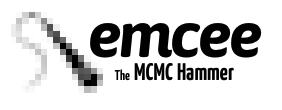
pure-Python implementation of *Goodman & Weare’s Affine Invariant Markov chain Monte Carlo (MCMC) Ensemble sampler*, siehe <br>
http://dan.iel.fm/emcee/current/

> Changelog: Version 2.2.0 (2016-07-12)

## Nachteile Metropolis/Gibbs
Ausgehend von aktuellem Parametervektor mit symmetrischer Sprungvorhersage
- Multimodale Verteilung ineffektiv abgetastet
- Korrelierte Parameter ineffektiv erreichbar
- Schwänze der Verteilung beibehalten

#### Schlechte Konvergenz
- Parameter dürfen nicht zu sehr korrelieren 
    - sonst zu kleine Schritte, nicht in Diagonalrichtung möglich

# Hamiltonian Monte Carlo *HMC*
Adaptiert an Form der Verteilung
- Sprungziel-Wahrscheinlichkeit in Richtung des Modus erhöht: Gradient
- Weite der Sprünge an Breite/Höhe der Verteilung angepaßt

#### Sprungziel
Anleihe aus der Physik: Hamilton-Operator
- Potential $\; -log(posterior)$
- Impuls
- Bewegung 
- Stop nach bestimmter Zeit

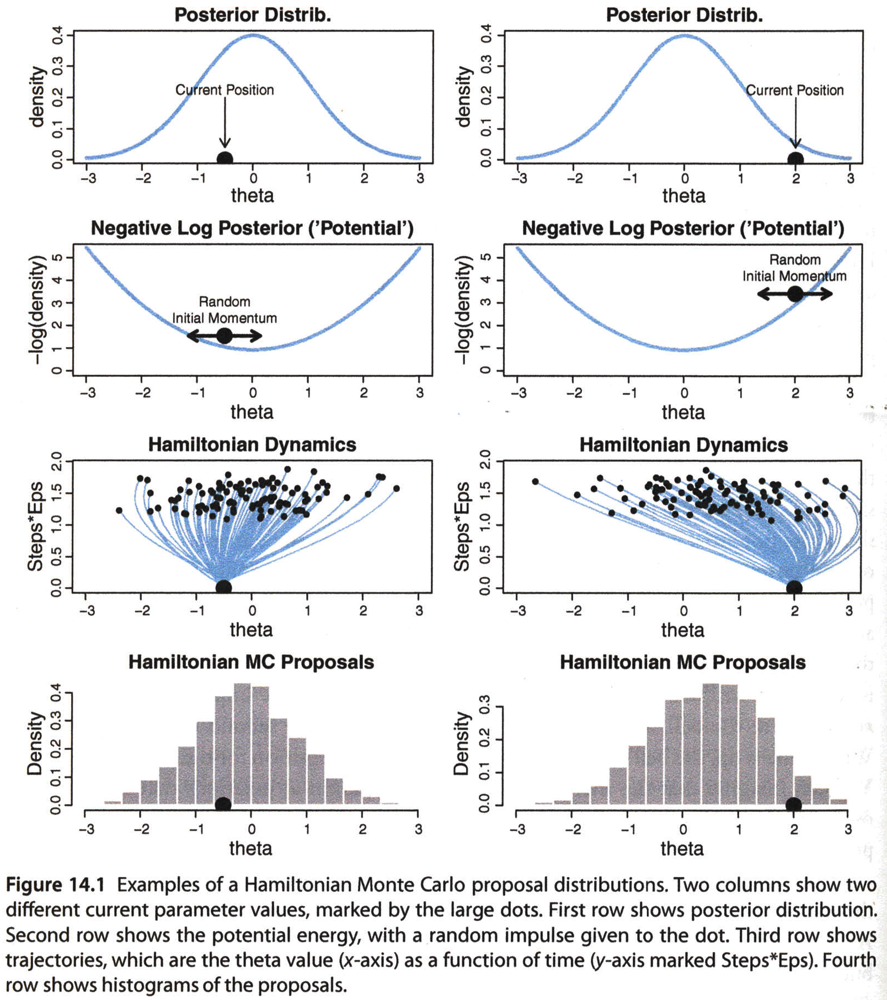

In [5]:
'''Hamiltonian Monte Carlo. Aus: Kruschke (2015) "Doing Bayesian Data Analysis, 2nd"'''

#### Sprung-Entscheidung
$$p_\mathrm{accept} = \mathrm{min}\Bigl(1,\;\frac{p(\theta_{\mathrm{proposed}}|D)p(\phi_{\mathrm{proposed}})}{p(\theta_{\mathrm{current}}|D)p(\phi_{\mathrm{current}})}\Bigr)$$
ähnlich wie Metropolis-Algorithmus, jedoch gewichtet gemäß dem Impuls $\phi$

- Erwartet wird (Energieerhaltungssatz) ein Verhältnis von $p_\mathrm{accept}=1$
- zufällige Abweichungen durch Diskretisierung des Bewegungswegs

### Ergebnis
HMC bildet eine Markov-Kette
- Kleine Schrittweite $\phi$ $\Rightarrow$ gute Näherung
- große Schrittweite $\Rightarrow$ grobe Annäherung

#### Anpassen an Posterior
- Schrittweite $\epsilon$ und Schrittanzahl

#### Anpassen an Statistik
- 65% Akzeptanz-Rate hat sich empirisch als sinnvoll herausgestellt
- *Burn in* -Schritte zu Beginn zur Adaptation

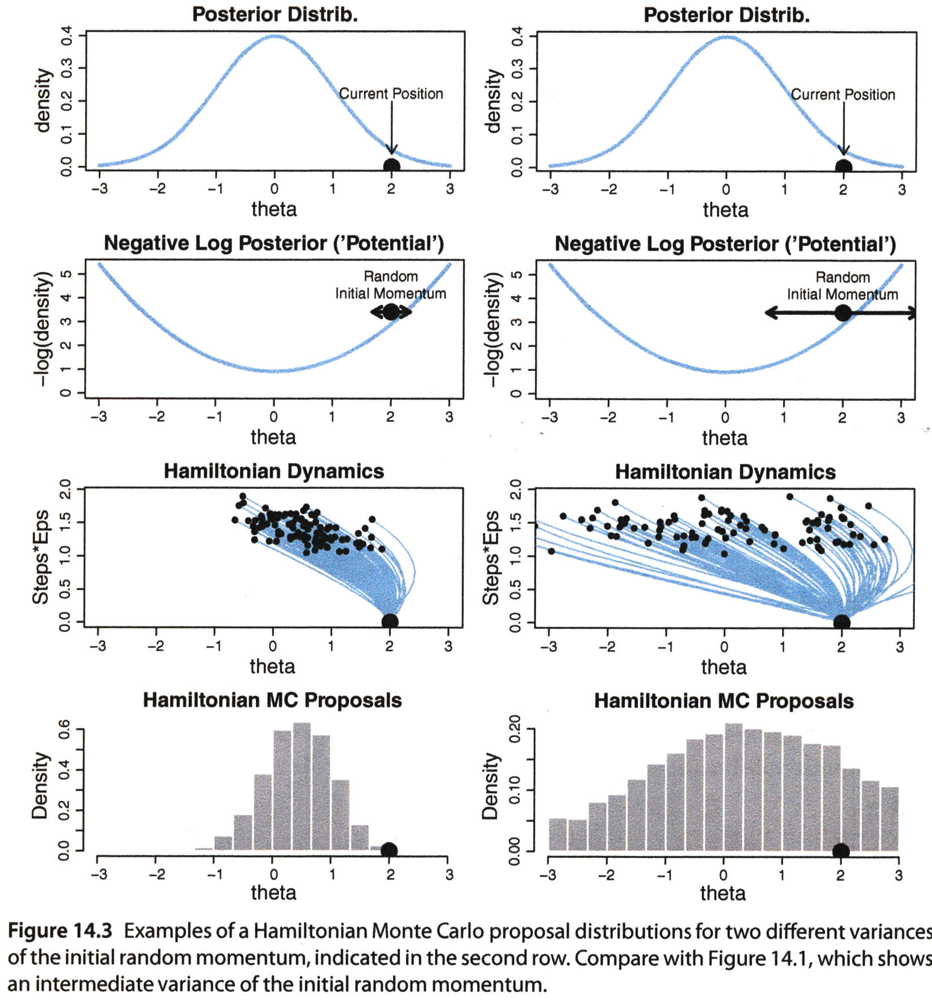

In [7]:
'''Hamiltonian MC - adapt moment (clustering / broadening). Aus: Kruschke (2015) "Doing Bayesian Data Analysis, 2nd"'''

#### Probleme


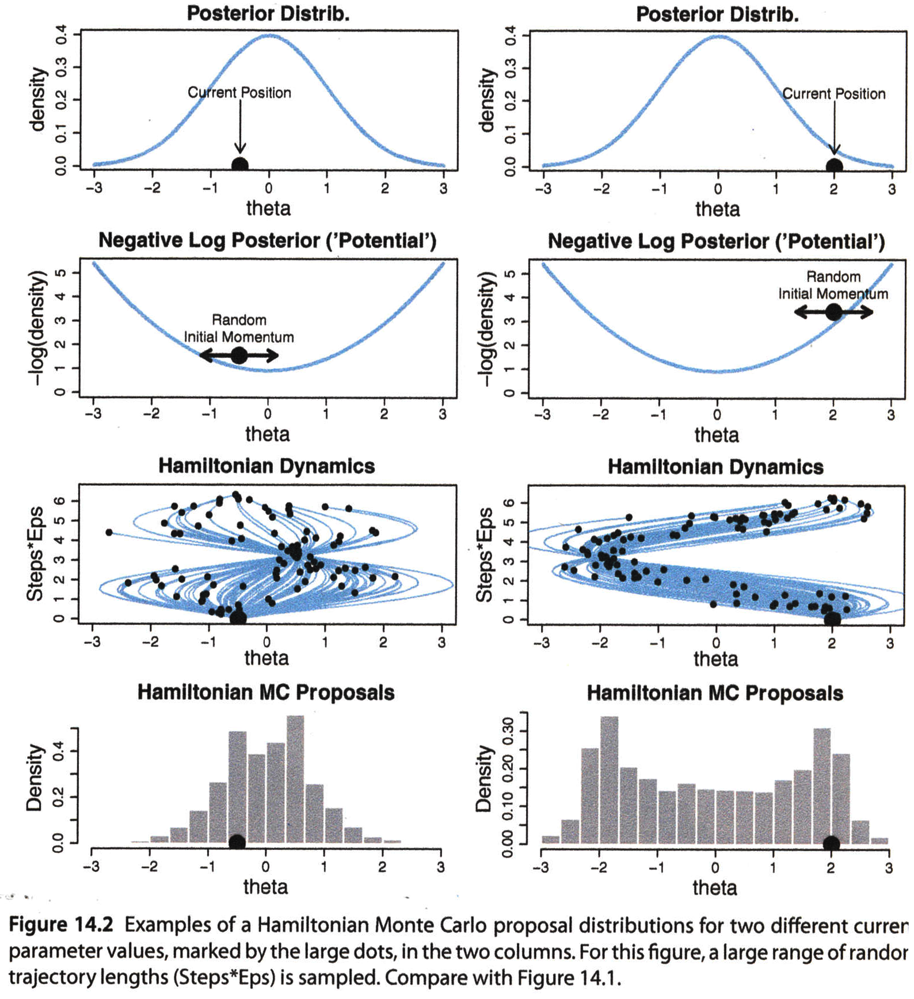

In [9]:
'''Hamiltonian MC problem: step length (too long). Aus: Kruschke (2015) "Doing Bayesian Data Analysis, 2nd"'''

# NUTS
**N**o **U**-**T**urn **S**ampler

Nachteil aller *random walks*:
- Um Entfernung $D$ zurückzulegen braucht es $D^2$ Schritte
- Am Ende eines Bereichs 
    - viele Samples
    - dreht um, also *negativer* Fortschritt (Wiederholung)

Also
- definiere Umkehrpunkt als einen iterativen Schritt mit Komponente auf Start zu -> Stop.

#### Literatur
- Hoffman, Gelman: https://arxiv.org/abs/1111.4246
- https://www.youtube.com/watch?v=oMNXRYRNj_M

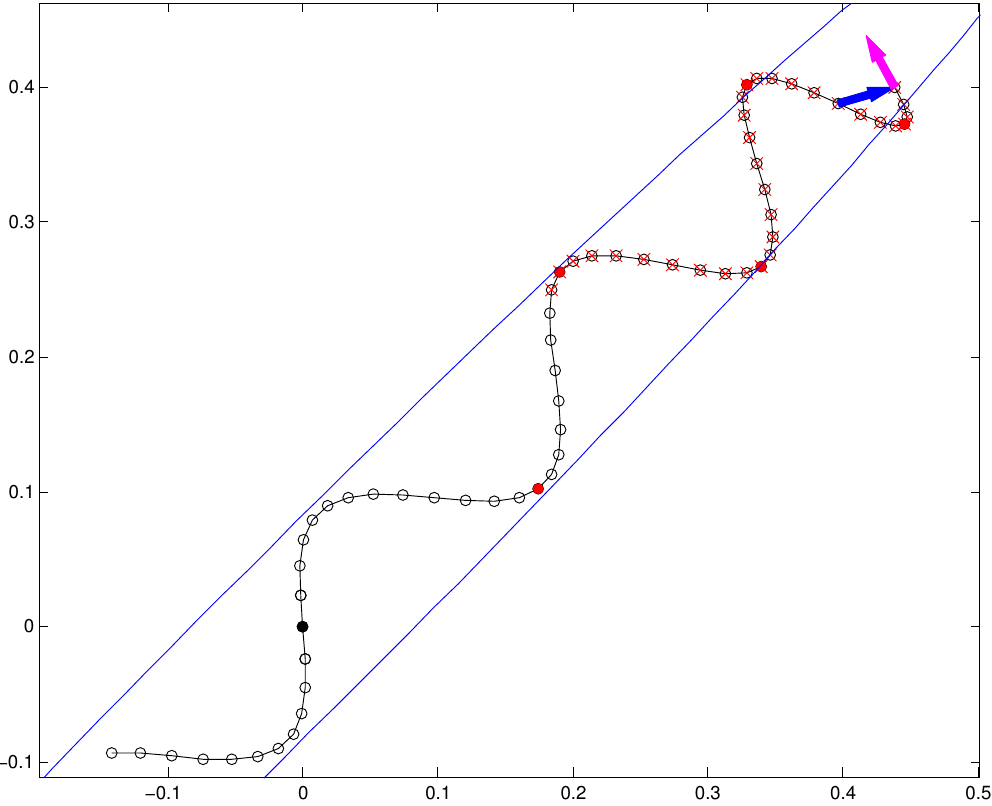

In [13]:
'''NUTS - one step: walk throug "potential" until u-turn. Aus: Hoffmann, Gelman "NUTS"'''

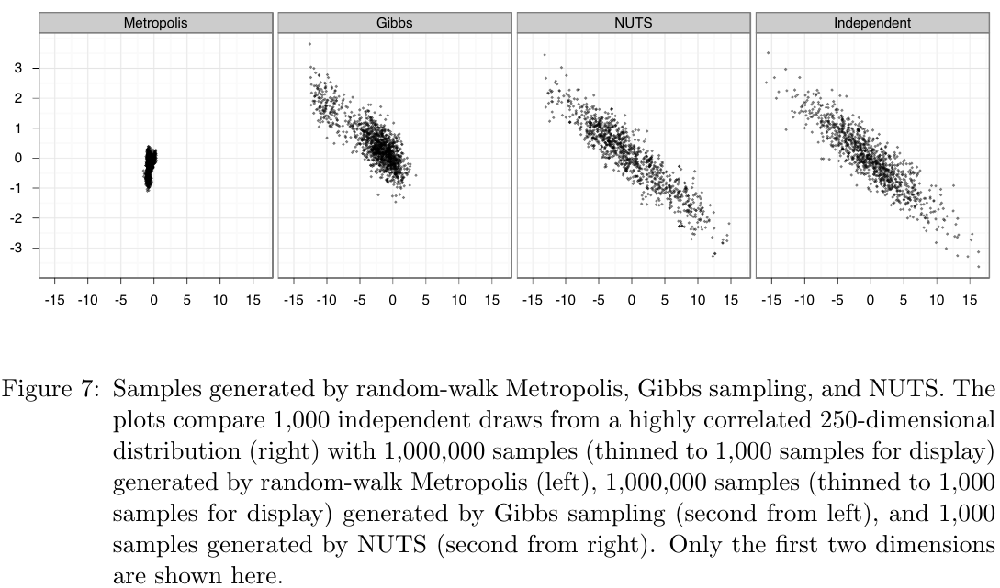

In [15]:
'''NUTS - results, and comparison to Metropolis and Gibbs. Aus: Hoffmann, Gelman "NUTS"'''

# Implementierung: Stan

![logo](images/Logo_stan_homepage_klein.png)

> Stan, named after Stanislaw Ulam, a mathematician who was one of the developers of the
> Monte Carlo method in the 1940s (Metropolis & Ulam, 1949), is a C++ program to perform
> Bayesian inference. The code is open-source and is available at http://mc-stan.org/ 
> along with instructions and a 500-page user manual. 
> Stan 1.0 was released in 2012

Zitat aus: http://www.stat.columbia.edu/~gelman/research/published/stan_jebs_2.pdf der Stan-Autoren

"Sampling Through Adaptive Neighborhoods"

- NUTS (*No-U-Turn Sampler*; Variante von Hamiltonian MC)
- Für Python, C++, R, Shell, Julia, Matlab, ....
- open-source software (new BSD; PyStan GPL V3)
- Version 2.17.1  (Dez. 2017)
- Link: http://mc-stan.org/
- Literatur: http://mc-stan.org/users/documentation/index.html

# Ziel eines guten Samplers

### 1) Repräsentative Samples
- Dafür gibt es keinen 100% Test
- Pfad der Kette anschauen *trace plot*
    - Abhängigkeit vom Startwert?
    - Verwaiste Pfade? 
    - Nebenmaxima?
    - gleiche Konvergenz mit anderen Zufallszahlen?
- *Burn in* abschneiden

Gut sind
- im *trace plot* überlappende Pfade ohne Abzweige
    - Konvergenz $\rightarrow$ Überlapp $\;\nRightarrow\;$ Überlapp $\rightarrow$ Konvergenz
- überlappender *density plot* (zur Glättung) in allen späteren Teilpfaden
- Anova unterschiedlicher Ketten
    - *shrink factor* (*Gelman Ruby factor*) kleiner als 1,1
    

### 2) ausreichende Länge
Genauigkeit und Stabilität für MLE und HDI

Messen der Klumpenbildung durch Autokorrelation
- große Werte nahe 1 für kleine Lags bedeuten Klumpenbildung
- Schritte sind nicht unabhängig, effektive Kettenlänge kürzer als Gesamtlänge
- *effective sample size, ESS* bewertet Autokorrelationen 
- ESS muß nicht so hoch sein für Mean/MAP
- ESS muß hoch sein für HDI, weil an der Grenze ja per Def. selten samples sind.
    - Daumenregel: 10.000 effektive Samples für das 95% HDI
- *Monte Carlo Standard Error, MCSE* analog zum Mittelwertsfehler
$$\text{MCSE} = \frac{SD}{\sqrt{ESS}}$$

### 3) Effizienz
in endlicher Zeit berechenbar
- wir haben zB. eine ganze Woche Rechenzeit für Priors auf Cluster mit 4 cuda-Karten

Hinweise:
- Parallelisieren auf CPU-Kerne
- Gibbs statt Metropolis Sampler (wenn angemessen)
- Hamiltonian (wenn angemessen)
- Umparametrisieren des Modells zur Korrelationsvermeidung
    - Bsp: unabhängige $\mu$ und $\delta$ anstatt $\alpha=\mu+\delta$ und $\beta=\mu-\delta$

# Zusammenfassung
- Ziel: Schlußfolgerung nach Bayes
    - Zugewinn an Wissen über zugrundeliegende Modellparameter
    - genaue Bestimmung des Posteriors
    
- Lösungen
    - Mathematisch geschlossene Lösung (*conjugate priors*)
    - Numerische (Gitter-) Näherungslösung
    - Stichproben durch MCMC

- Beispiele von MCMC
    - Metropolis-Algorithmus vorwärts/rückwärts springen
    - Metropolis-Algorithmus per Gauß-Sprung, auch mehrdimensional
    - Gibbs Sampling einzelner Parameter hintereinander
    - Hamilton'sche Bewegung im Potential
        - No U-Turn Sampler *NUTS*

- $\Rightarrow$ zufällige, repräsentative Stichproben aus der Posterior-Landschaft. 
    - $\Rightarrow$ Punktschätzer für Erwartungswert: *posterior mean*
    - $\Rightarrow$ *Credible Interval* CI/HDI

- Genauigkeit überprüfen
    - Rahmenbedingungen
    - Kontroll-Auswertungen graphisch und numerisch

## Literatur
- Kruschke, J. K. (2015): Doing Bayesian Data Analysis, Second Edition. Academic Press / Elsevier
- Matthew D. Hoffman, Andrew Gelman (2011): The No-U-Turn Sampler: Adaptively Setting Path Lengths in Hamiltonian Monte Carlo; https://arxiv.org/abs/1111.4246

## Ausblick
Verwende fertige Softwarepakete, die all das *automatisch* liefern
- Stan
    - PyStan

# Fragen?